We'll expand on our python data cleaning, analysis, and visualization skills by working with [Baltimore City Police Department data]() from the Baltimore City Open Data portal.

## import packages 

In [182]:
# import packages to conduct data analysis and to make interactive charts and maps

import pandas as pd # for data analysis
import datetime as dt # to manipulate date/time data
import numpy as np # for data analysis
import plotly.express as px # for visualizations

## import data

[Previously](https://colab.research.google.com/drive/14PJV4aPg01xX7-XnIUtrC6_GqgeriZj1) we imported data from a link to a csv uploaded to GitHub. Here, we'll upload data from a file on our computer. This might be useful if we don't have a GitHub profile or if we have a file that:
 - Is larger than 25 MB, which won't upload to GitHub
 - We don't want to convert to a CSV (e.g. part of already performed Excel analysis, etc.)
 - Is proprietary data/not our own data that we don't want to upload even to a private GitHub repository
 



### Importing a Data File from Your Local Machine 

Similar to saving the website link as a __variable__, here we'll save the file path name to our file as a variable. If we drag the data file into the same file as our jupyter lab notebook, we don't need to list the path file names outside of the folder we're working in, however, if our data file is in a different location on our machine--and if we don't want to move it--then we'll need to list the entire path name. 

We can get the path name for our file by: 
 - __MacOS:__ CONTROL + click and while menu is up, press the OPTION key. The menu options should change, and you should see a menu option that says "Copy "filename.csv" as Pathname." Click this to copy the file pathname. 
 - __Windows:__ SHIFT + right click, choose "Copy as Path"

In [183]:
# save file name as a variable with the file name in ""

data_bpd = "BPD_Arrests.csv"

In [184]:
# import data as a dataframe to manipulate

df_bpd = pd.read_csv(data_bpd)

In [185]:
# preview the data

df_bpd.head()

,Arrest,Age,Sex,Race,ArrestDate,ArrestTime,ArrestLocation,IncidentOffense,IncidentLocation,Charge,ChargeDescription,District,Post,Neighborhood,Longitude,Latitude,Location 1,2010 Census Neighborhoods,2010 Census Wards Precincts,Zip Codes
0,14215855.0,37.0,M,W,12/31/2014,04:00,NaN,Unknown Offense,NaN,NaN,FUGITIVE FROM COLORADO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,24.0,M,B,12/30/2015,14:30,NaN,Unknown Offense,NaN,NaN,Unknown Charge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,41.0,M,B,12/14/2019,16:35,NaN,Unknown Offense,NaN,NaN,Unknown Charge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,46.0,M,W,12/11/2019,15:45,NaN,Unknown Offense,NaN,NaN,Unknown Charge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,19174456.0,39.0,F,B,12/10/2019,10:48,NaN,Unknown Offense,NaN,NaN,DETAIN ONLY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Inspecting Data

Now we can see what our data looks like, but we don't know much about what's happening within the dataset and what we can and can't potentially do with this. There are a few functions that we can use to gain some high-level insights into what our data has.

### General Big-Picture Counts and Stats 

In [186]:
# to look at the stats on the columns we have numbers in we can use df.describe() to give us 
#the count, mean, maximum, minimum, standard deviation, and percentiles within those columns

df_bpd.describe()

,Arrest,Age,Post,Neighborhood,Longitude,Latitude,Location 1,2010 Census Neighborhoods,2010 Census Wards Precincts,Zip Codes
count,1.480700e+05,155419.000000,81182.000000,0.0,81368.000000,81368.000000,0.0,0.0,0.0,0.0
mean,1.630904e+07,32.937614,523.180656,NaN,-76.620020,39.301230,NaN,NaN,NaN,NaN
std,1.774276e+06,11.439888,269.493314,NaN,0.049388,0.035945,NaN,NaN,NaN,NaN
min,1.400004e+07,14.000000,111.000000,NaN,-77.459414,38.373311,NaN,NaN,NaN,NaN
25%,1.500875e+07,24.000000,312.000000,NaN,-76.646939,39.288009,NaN,NaN,NaN,NaN
50%,1.610186e+07,30.000000,514.000000,NaN,-76.616914,39.301019,NaN,NaN,NaN,NaN
75%,1.804422e+07,40.000000,734.000000,NaN,-76.588177,39.317096,NaN,NaN,NaN,NaN
max,2.001697e+07,100.000000,943.000000,NaN,-75.596028,39.585350,NaN,NaN,NaN,NaN


In [187]:
# we can also use df.info() to see the data types within columns
# this will be important if some of our "number" columns aren't actually "numbers"
# or if we need to convert columns to dates or times

df_bpd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155461 entries, 0 to 155460
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Arrest                       148070 non-null  float64
 1   Age                          155419 non-null  float64
 2   Sex                          155461 non-null  object 
 3   Race                         155461 non-null  object 
 4   ArrestDate                   155461 non-null  object 
 5   ArrestTime                   155461 non-null  object 
 6   ArrestLocation               82735 non-null   object 
 7   IncidentOffense              155461 non-null  object 
 8   IncidentLocation             82735 non-null   object 
 9   Charge                       137953 non-null  object 
 10  ChargeDescription            155461 non-null  object 
 11  District                     81179 non-null   object 
 12  Post                         81182 non-null   float64
 13 

## Data Cleaning 

There are a few types of __data types__ that we'll need to be concerned with in our analysis for this class: 

 - __object or string (str)__: these are any combination of letters, numbers, and characters that are essentially an entity of data. We can manipulate these objects by splitting on specific characters, adding or subtracting, grouping by similarities, etc.
 - __integer (int)__: these are integers. We can perform any arithmetic function with these as long as the equation elements are also integers or...
 - __float (float)__: these are numbers that have a decimal in them. Similar to integers, we can perform any arithmetic functions on these values
 - __datetime (datetime)__: these are dates, times, or both dates and times. It's advantageous to convert actual date/time data into a datetime format so that we can perform arithmetic on these values (e.g. subtracting dates to get the number of days in between, adding times to get an end time, etc.)
 - __Boolean (bool)__: these are data types that are either True or False. We use boolean data types a lot in Python logic expressions

Most of our numerical data in our BPD dataset is already classified as an int, but our date and time values are classified as "objects." We can convert our date and time columns into date/time values by "redefining" them.

In [188]:
# remove all non numerical values from ArrestDate and ArrestTime
df_bpd = df_bpd[df_bpd[["ArrestDate","ArrestTime"]].notnull().all(1)]

Next, we'll create a new column that combines the arrest date and time so that we can convert this to a datetime datatype and manipulate the data.

In [189]:
# combine arrest date and time columns
df_bpd["ArrestDateTime"] = df_bpd["ArrestDate"] + " " + df_bpd["ArrestTime"]

In [190]:
# preview the new column
df_bpd.head()

,Arrest,Age,Sex,Race,ArrestDate,ArrestTime,ArrestLocation,IncidentOffense,IncidentLocation,Charge,...,District,Post,Neighborhood,Longitude,Latitude,Location 1,2010 Census Neighborhoods,2010 Census Wards Precincts,Zip Codes,ArrestDateTime
0,14215855.0,37.0,M,W,12/31/2014,04:00,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12/31/2014 04:00
1,NaN,24.0,M,B,12/30/2015,14:30,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12/30/2015 14:30
2,NaN,41.0,M,B,12/14/2019,16:35,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12/14/2019 16:35
3,NaN,46.0,M,W,12/11/2019,15:45,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12/11/2019 15:45
4,19174456.0,39.0,F,B,12/10/2019,10:48,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12/10/2019 10:48


In [191]:
# convert ArrestDateTime column to datetime

df_bpd["ArrestDateTime"] = pd.to_datetime(df_bpd["ArrestDateTime"])

In [192]:
# now check to see that we converted our column to a datetime format
df_bpd.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 155461 entries, 0 to 155460
Data columns (total 21 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   Arrest                       148070 non-null  float64       
 1   Age                          155419 non-null  float64       
 2   Sex                          155461 non-null  object        
 3   Race                         155461 non-null  object        
 4   ArrestDate                   155461 non-null  object        
 5   ArrestTime                   155461 non-null  object        
 6   ArrestLocation               82735 non-null   object        
 7   IncidentOffense              155461 non-null  object        
 8   IncidentLocation             82735 non-null   object        
 9   Charge                       137953 non-null  object        
 10  ChargeDescription            155461 non-null  object        
 11  District                  

In [193]:
# preview data
df_bpd.head(3)

,Arrest,Age,Sex,Race,ArrestDate,ArrestTime,ArrestLocation,IncidentOffense,IncidentLocation,Charge,...,District,Post,Neighborhood,Longitude,Latitude,Location 1,2010 Census Neighborhoods,2010 Census Wards Precincts,Zip Codes,ArrestDateTime
0,14215855.0,37.0,M,W,12/31/2014,04:00,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-12-31 04:00:00
1,NaN,24.0,M,B,12/30/2015,14:30,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-30 14:30:00
2,NaN,41.0,M,B,12/14/2019,16:35,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-12-14 16:35:00


## Data Manipulation

Now that we have our data set up with the correct data types, we can start to dive deep and aggregate this information to better understand what's happening with the Baltimore City Police Department and the arrests over time. 

#### Arrest Year Column 

Let's look at how a few of these column values change each year. To make this easier, we'll create a new column for the _ArrestYear_ from the ArrestDate column, and then aggregate some variables by the year column. 

In [194]:
# make a new column for the ArrestDate year
df_bpd["ArrestYear"] = df_bpd["ArrestDateTime"].dt.year

We may also want to look at arrests by month or day of the week, so we'll add these columns as well

In [195]:
# make columns to define the month and day of the week
df_bpd["ArrestMonth"] = df_bpd["ArrestDateTime"].dt.month
df_bpd["ArrestWeekday"] = df_bpd["ArrestDateTime"].dt.dayofweek #Monday = 0, Sunday = 6

In [196]:
# check new columns
df_bpd.head()

,Arrest,Age,Sex,Race,ArrestDate,ArrestTime,ArrestLocation,IncidentOffense,IncidentLocation,Charge,...,Longitude,Latitude,Location 1,2010 Census Neighborhoods,2010 Census Wards Precincts,Zip Codes,ArrestDateTime,ArrestYear,ArrestMonth,ArrestWeekday
0,14215855.0,37.0,M,W,12/31/2014,04:00,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2014-12-31 04:00:00,2014,12,2
1,NaN,24.0,M,B,12/30/2015,14:30,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-30 14:30:00,2015,12,2
2,NaN,41.0,M,B,12/14/2019,16:35,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2019-12-14 16:35:00,2019,12,5
3,NaN,46.0,M,W,12/11/2019,15:45,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2019-12-11 15:45:00,2019,12,2
4,19174456.0,39.0,F,B,12/10/2019,10:48,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2019-12-10 10:48:00,2019,12,1


#### How have the number of crimes in the daytime, evening, and night changed over the years?

We'll define daytime, evening, and night as: 
 - __morning__: 12 AM-8 AM
 - __daytime__: 8 AM - 4 PM
 - __night__: 4 PM-12 AM

and categorize each arrest automatically by separating the time of day into equal bins

In [197]:
# first, make a new column that extracts the arrest time hour
df_bpd["ArrestHour"] = df_bpd["ArrestDateTime"].dt.hour

In [198]:
# separate our ArrestHour column into bins
df_bpd["TimeOfDay"] = pd.cut(df_bpd["ArrestHour"], bins=3, labels=["morning", "daytime", "night"])

In [199]:
df_bpd.head(2)

,Arrest,Age,Sex,Race,ArrestDate,ArrestTime,ArrestLocation,IncidentOffense,IncidentLocation,Charge,...,Location 1,2010 Census Neighborhoods,2010 Census Wards Precincts,Zip Codes,ArrestDateTime,ArrestYear,ArrestMonth,ArrestWeekday,ArrestHour,TimeOfDay
0,14215855.0,37.0,M,W,12/31/2014,04:00,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,2014-12-31 04:00:00,2014,12,2,4,morning
1,NaN,24.0,M,B,12/30/2015,14:30,NaN,Unknown Offense,NaN,NaN,...,NaN,NaN,NaN,NaN,2015-12-30 14:30:00,2015,12,2,14,daytime


Now, we want to create an aggregated table of the number of arrests per day "segment" for each year. Previously we did this by using the Python version of a pivot table. Here, we'll use the pandas.groupby function to similarly group our column values. 

The general formula for a pandas groupby function is: 

```
new_df = df.groupby("columns you want to aggregate")["columns you want as the values/what you will perform functions on"].agg([calculation_you_want_to_perform])
```

Here, we'll aggregate/group the dataframe by arrest year __and__ day segment and count the number of arrests in each segment by using the arrest ID as the unique identifier to count values.

In [202]:
# make an aggregated dataframe to look at the number of arrests in each day segment over the years available

df_arrest_times = df_bpd.groupby(["ArrestYear", "TimeOfDay"])["Arrest"].agg(["count"]).reset_index()

In [203]:
# preview new dataframe
df_arrest_times.head()

,ArrestYear,TimeOfDay,count
0,2014,morning,7472
1,2014,daytime,14163
2,2014,night,14347
3,2015,morning,4580
4,2015,daytime,10375


## Data Visualizations 

Here, we'll make a few visualizations to look at this distribution in interactive charts with plotly express

#### Line Graph to Compare Number of Arrests per year 

In [204]:
# line graph of number of arrrests in each time period,

line_timeofday_arrests = px.line(df_arrest_times,
                                x = "ArrestYear",
                                y = "count",
                                color = "TimeOfDay",
                                hover_name = "count",
                                title = "Number of Baltimore City Police Department Arrests from 2014-Feb. 2020",
                                labels = {"ArrestYear": "Year", "TimeOfDay": "Day Period"},
                                )

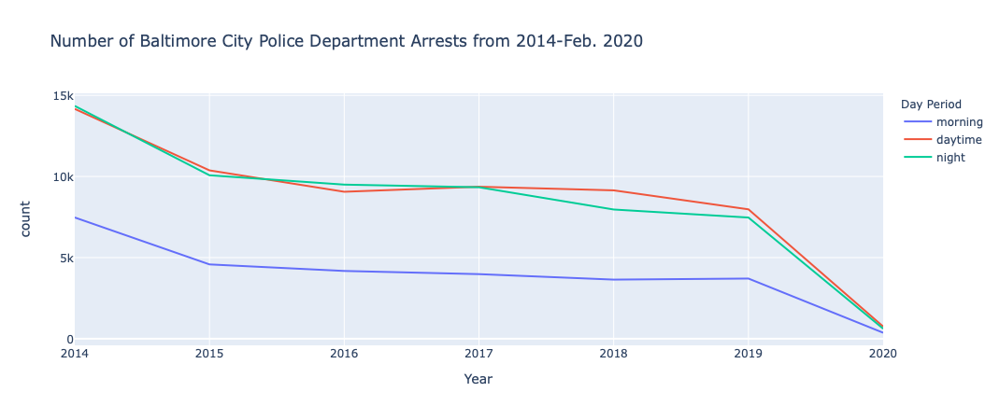

In [205]:
# view line graph
line_timeofday_arrests

In [207]:
# export the visual to an html to share
line_timeofday_arrests.write_html("line_graph_bpd_arrest_dayperiod.html")

#### Pie Chart to compare the distribution of arrests throughout the week 

In [210]:
# make a pie chart to show distribution of arrests during the week
week_dist_arrests = px.pie(df_bpd, 
                           values="Arrest", 
                           names="ArrestWeekday")

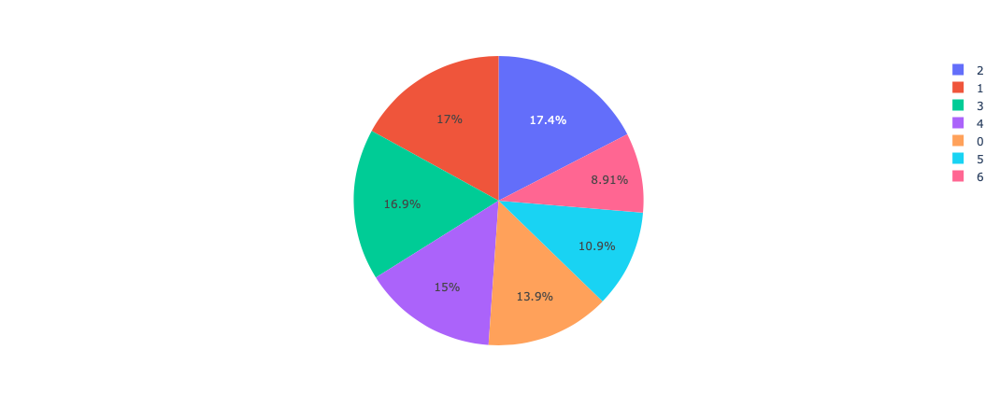

In [211]:
# show pie chart
week_dist_arrests

#### Plotly Animation to show changes in number of arrests over years

In [214]:
# aggregate data to count the number of arrests per weekday per year
df_weekday_arrests = df_bpd.groupby(["ArrestYear", "ArrestWeekday"]).agg({"Age": "mean",
                                                                         "Arrest": "count"}).reset_index()

In [215]:
# preview new df
df_weekday_arrests.head()

,ArrestYear,ArrestWeekday,Age,Arrest
0,2014,0,33.293984,4920
1,2014,1,33.243659,5824
2,2014,2,33.497744,6218
3,2014,3,33.271487,6164
4,2014,4,33.180714,5464


In [217]:
# look up the maximum value for number of arrests to add into the animation 
df_weekday_arrests["Arrest"].max()

6218

In [219]:
# make animated bar chart to show changes in number of arrests during each week day over the years provided
animation_bar_arrests    = px.bar(df_weekday_arrests, 
                           x="ArrestWeekday", 
                           y="Arrest", 
                           animation_frame="ArrestYear", 
                           #size="column that the radius of the bubble is correlated with", 
                           #color="column that the chart color corresponds with", 
                           hover_name="Arrest",
                           title = "Number of BPD Arrests by Weekday from 2014- Feb 2020",
                           range_x=[0,6], # range of x values
                           range_y=[0,6300]) # range of y values

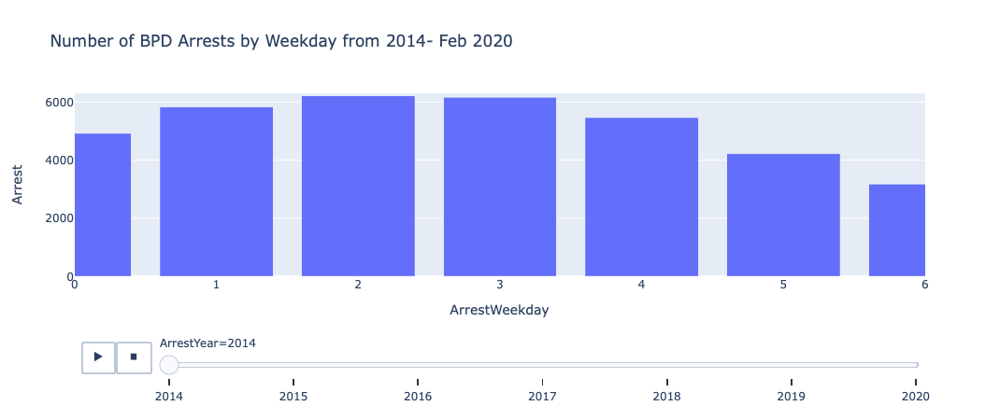

In [220]:
# view animation
animation_bar_arrests

In [221]:
# export animation to html
animation_bar_arrests.write_html("weekday_arrest_trend_animation.html")